In this notebook, I will preprocess the Zheng et al 2022 dataset.

In [1]:
import scanpy as sc

In [2]:
import anndata as ad

In [3]:
! ls

PART_1_generate_anndata_objects_using_SCANPY.ipynb
Python_Objects
Untitled.ipynb
Untitled1.ipynb
Untitled2.ipynb
bash_scripts
initial_generation_of_anndata_object_with_some_errors_and_solutions.ipynb


In [4]:
! ls Python_Objects

GSE174574_combined.h5ad


In [5]:
import os

In [6]:
adata = sc.read_h5ad(filename= os.path.join("Python_Objects", "GSE174574_combined.h5ad"))

In [7]:
adata

AnnData object with n_obs × n_vars = 58528 × 27998
    obs: 'sample'
    var: 'gene_ids', 'feature_types'

In [8]:
sc.settings.set_figure_params(dpi=50, facecolor="white")

In [9]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

In [10]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

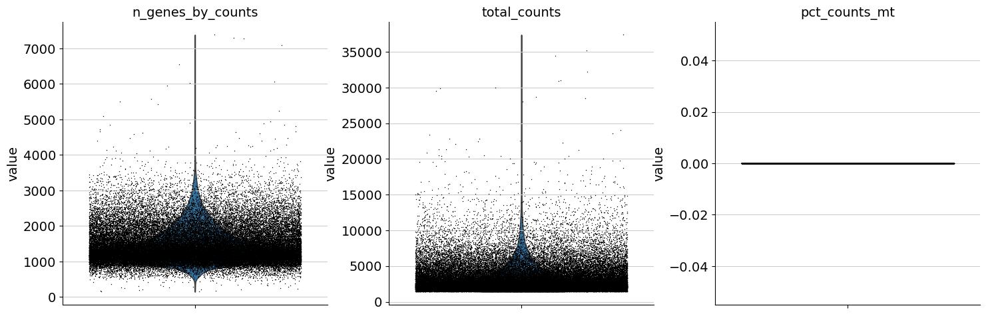

In [24]:
# Generate the violin plot with a specific figure size
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True)

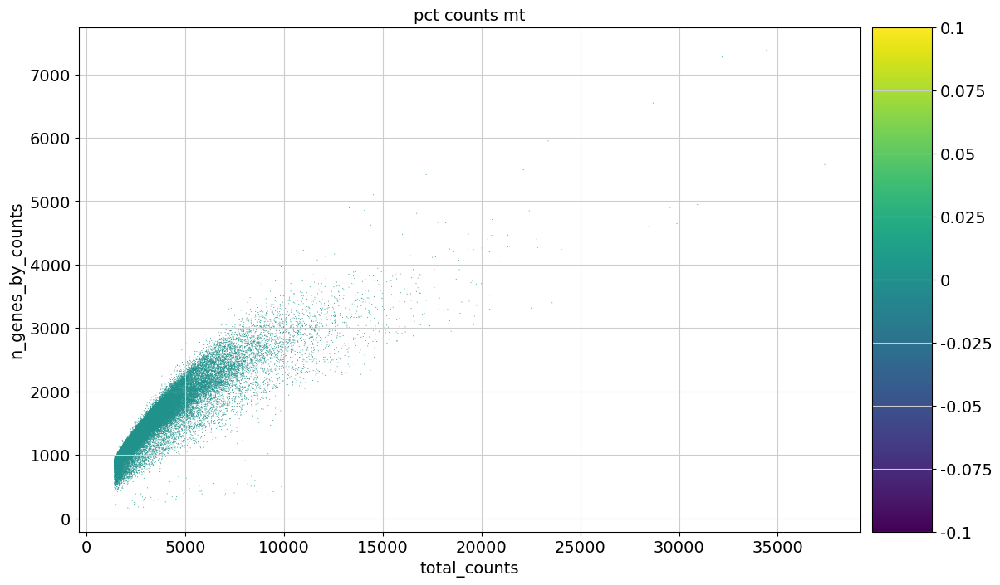

In [26]:
from matplotlib import rcParams
# Set initial global figure size
FIGSIZE = (10, 8)  # Desired figure size (width, height)
rcParams["figure.figsize"] = FIGSIZE

# Generate the scatter plot
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

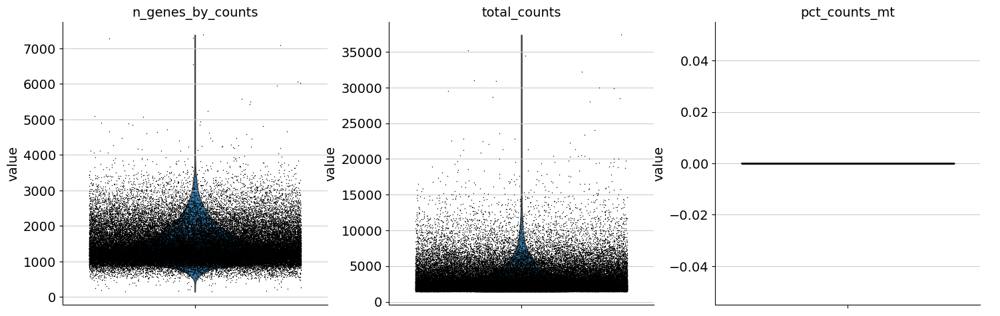

In [30]:
import matplotlib.pyplot as plt
# Generate the violin plot
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

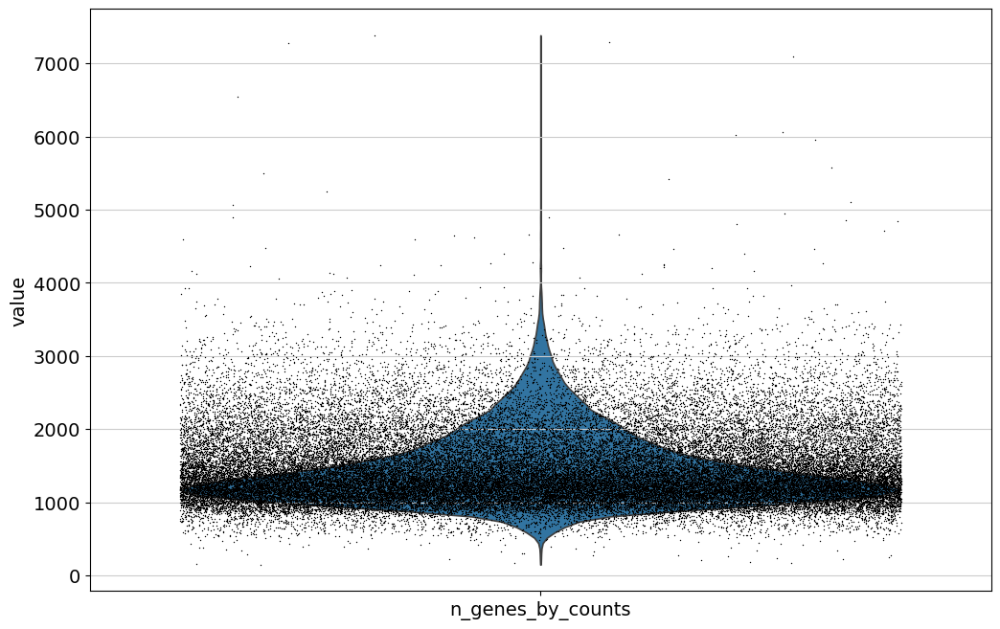

In [33]:
# Generate the violin plot
sc.pl.violin(
    adata,
    ["n_genes_by_counts"],
    jitter=0.4
)

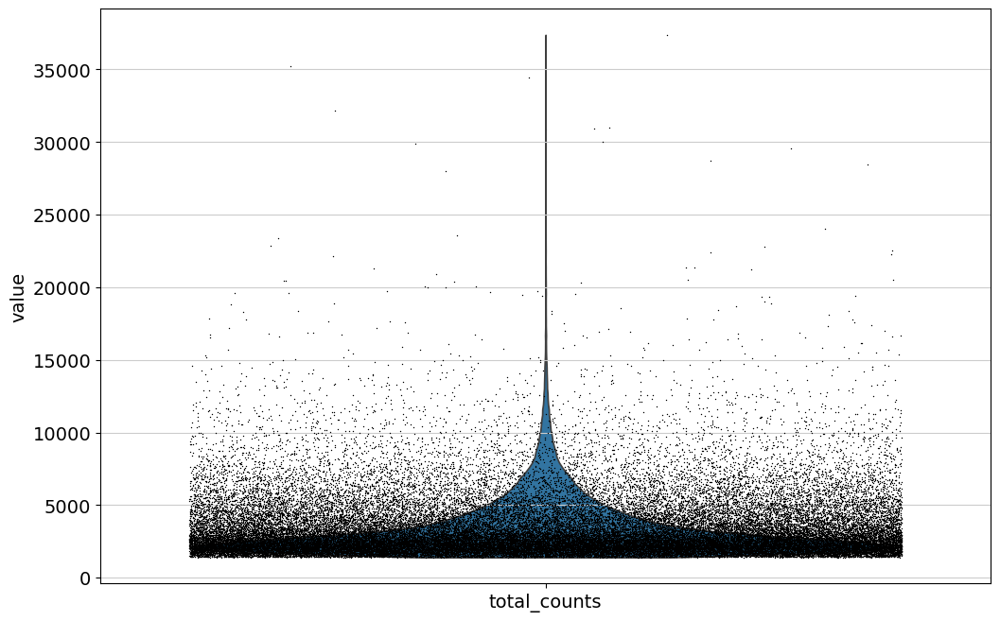

In [34]:

# Generate the violin plot
sc.pl.violin(
    adata,
    ["total_counts"],
    jitter=0.4
)

In [35]:
adata.obs

,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb
AAACCTGAGCGAAGGG-1-GSM5319988_sham2_,GSM5319988_sham2_,933,6.839476,1438.0,7.271704,25.034771,34.631433,48.539638,69.888734,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGAGCTAACAA-1-GSM5319988_sham2_,GSM5319988_sham2_,983,6.891626,1603.0,7.380256,27.573300,37.117904,49.594510,69.868996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGAGGCTAGCA-1-GSM5319988_sham2_,GSM5319988_sham2_,1298,7.169350,2384.0,7.776955,27.684564,36.912752,47.986577,66.526846,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGAGGTGCACA-1-GSM5319988_sham2_,GSM5319988_sham2_,1309,7.177782,2906.0,7.974877,30.178940,41.500344,53.647626,72.161046,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGAGTTTAGGA-1-GSM5319988_sham2_,GSM5319988_sham2_,1164,7.060476,2928.0,7.982416,36.748634,48.258197,60.211749,77.322404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTCTCATCC-1-GSM5319991_MCAO2_,GSM5319991_MCAO2_,1608,7.383368,4165.0,8.334712,43.745498,50.132053,58.103241,73.085234,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTCAGTGCGCTTG-1-GSM5319991_MCAO2_,GSM5319991_MCAO2_,957,6.864848,1602.0,7.379632,31.772784,39.762797,52.247191,71.473159,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTCAGTGTGCCTG-1-GSM5319991_MCAO2_,GSM5319991_MCAO2_,1053,6.960348,1911.0,7.555905,31.292517,39.979069,51.491366,71.062271,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTCAGTTACCGAT-1-GSM5319991_MCAO2_,GSM5319991_MCAO2_,5950,8.691315,23375.0,10.059465,25.326203,32.624599,41.283422,54.275936,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


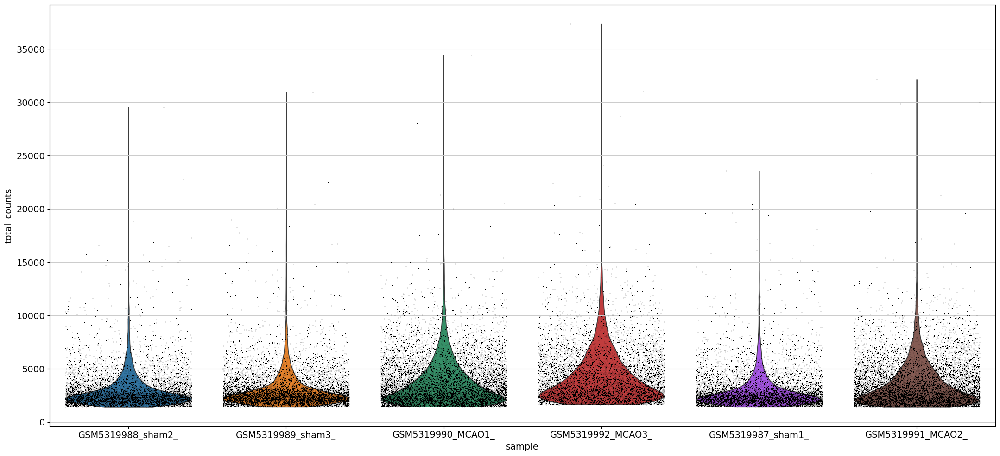

In [39]:

FIGSIZE = (20, 12)  # Desired figure size (width, height)
rcParams["figure.figsize"] = FIGSIZE

# Generate the violin plot
sc.pl.violin(
    adata,
    ["total_counts"],
    groupby= "sample",
    jitter=0.4
)

In [40]:
adata

AnnData object with n_obs × n_vars = 58528 × 27998
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'sample_colors'

In [41]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

In [42]:
adata.shape

(58528, 19707)

In [43]:
sc.pp.scrublet(adata, batch_key="sample")

In [44]:
adata.obs.columns

Index(['sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'total_counts_mt',
       'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb',
       'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score',
       'predicted_doublet'],
      dtype='object')

In [46]:
adata.obs["predicted_doublet"].value_counts()

predicted_doublet
False    56658
True      1870
Name: count, dtype: int64

In [51]:
adata.obs["doublet_score"].describe()

count    58528.000000
mean         0.052435
std          0.065351
min          0.001018
25%          0.018668
50%          0.034965
75%          0.060674
max          0.663717
Name: doublet_score, dtype: float64

In [56]:
# Saving count data
adata.layers["counts"] = adata.X.copy()

In [57]:
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)

In [58]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key="sample")

In [72]:
sc.settings.set_figure_params(dpi=60, facecolor="white")

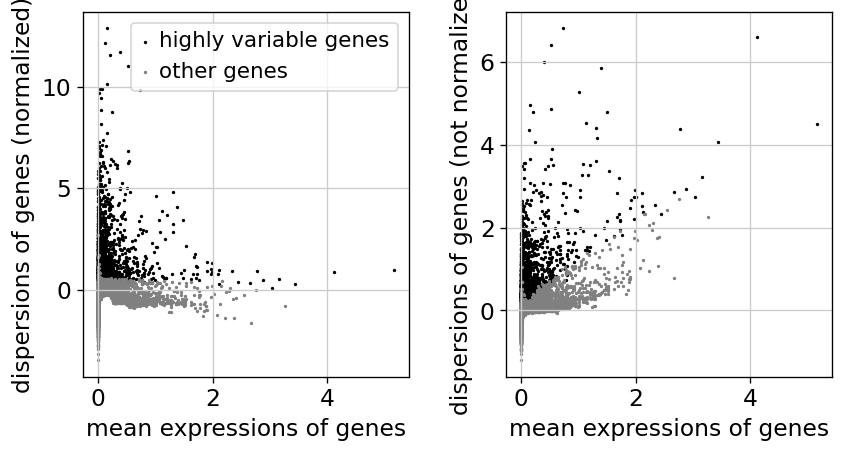

In [73]:
sc.pl.highly_variable_genes(adata)

In [74]:
sc.tl.pca(adata)

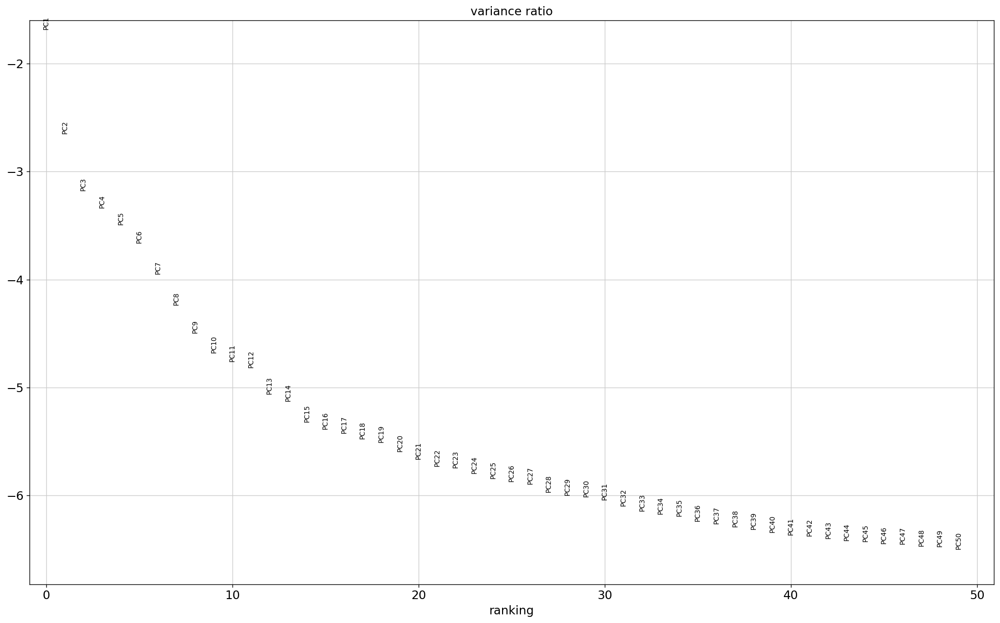

In [76]:

FIGSIZE = (20, 12)  # Desired figure size (width, height)
rcParams["figure.figsize"] = FIGSIZE

sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

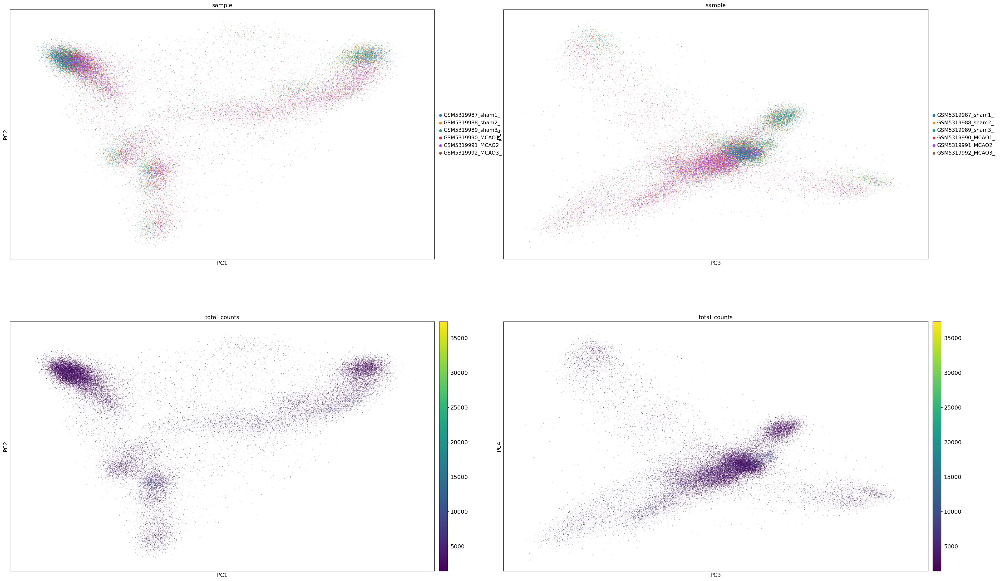

In [77]:
sc.pl.pca(
    adata,
    color=["sample", "sample", "total_counts", "total_counts"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=2,
)

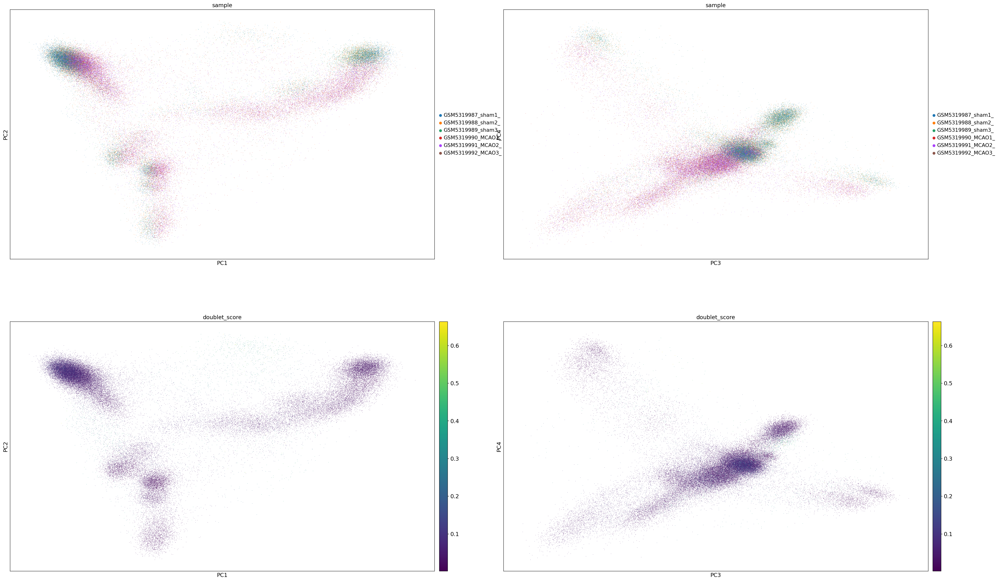

In [78]:
sc.pl.pca(
    adata,
    color=["sample", "sample", "doublet_score", "doublet_score"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=2,
)

In [79]:
sc.pp.neighbors(adata)

/fast/home/y/ykazci/miniforge3/envs/scanpy_loompy/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [80]:
sc.tl.umap(adata)

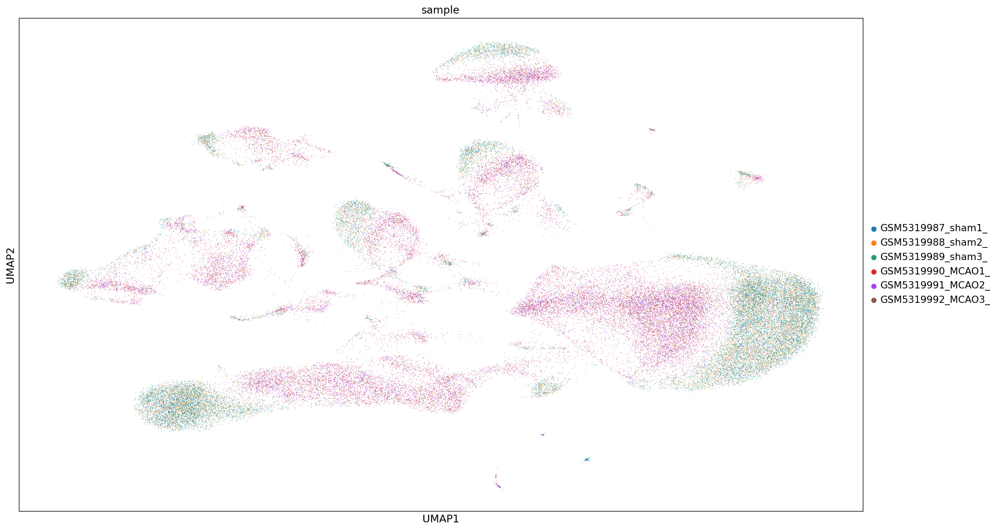

In [81]:
sc.pl.umap(
    adata,
    color="sample",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

In [82]:
adata.obs.columns

Index(['sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'total_counts_mt',
       'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb',
       'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score',
       'predicted_doublet'],
      dtype='object')

In [85]:
adata.obs['status'] = adata.obs['sample'].apply(
    lambda x: "control" if "sham" in x else "treatment"
)

In [88]:
adata.obs["status"].value_counts()

status
treatment    31237
control      27291
Name: count, dtype: int64

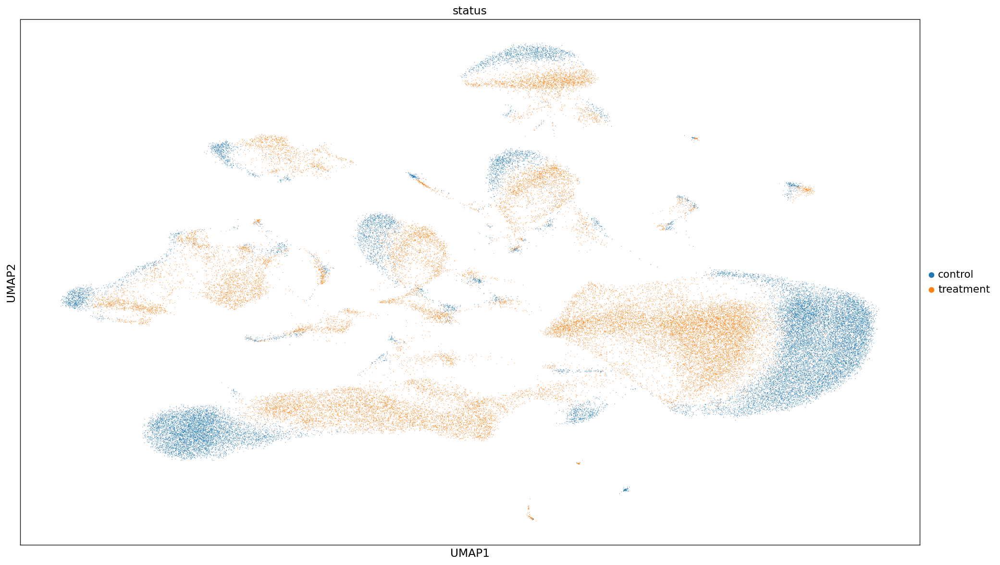

In [89]:
sc.pl.umap(
    adata,
    color="status",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

From ScanPy tutorial:
"If you inspect batch effects in your UMAP it can be beneficial to integrate 
across samples and perform batch correction/integration. We recommend 
checking out scanorama and scvi-tools for batch integration."

In [90]:
# Using the igraph implementation and a fixed number of iterations can be significantly faster, especially for larger datasets
sc.tl.leiden(adata, flavor="igraph", n_iterations=2)

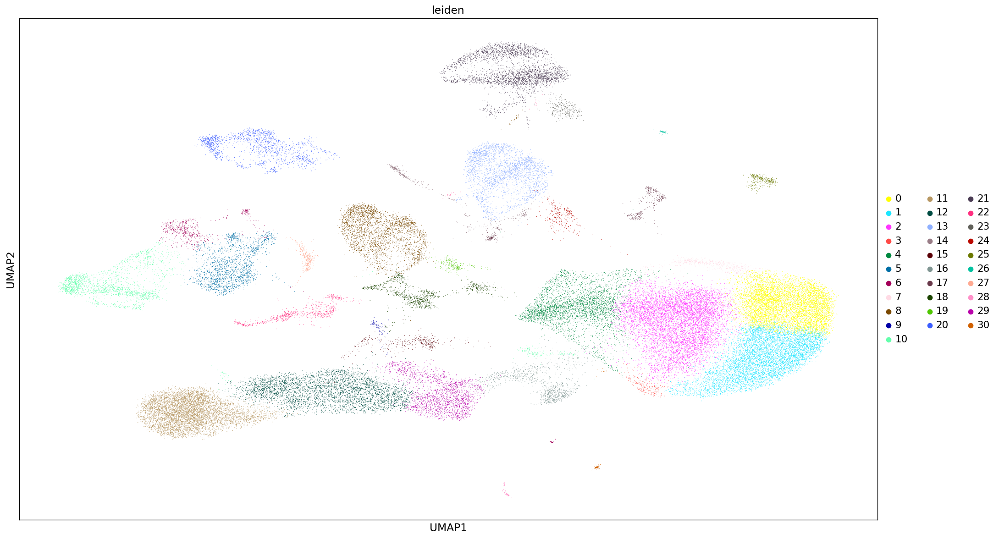

In [91]:
sc.pl.umap(adata, color=["leiden"])

In [92]:
my_colours = [
    "#5A5156FF", "#F6222EFF", "#FE00FAFF", "#16FF32FF",
    "#3283FEFF", "#FEAF16FF", "#B00068FF", "#1CFFCEFF", "#90AD1CFF",
    "#2ED9FFFF", "#DEA0FDFF", "#AA0DFEFF", "#F8A19FFF", "#325A9BFF",
    "#C4451CFF", "#1C8356FF", "#85660DFF", "#B10DA1FF", "#FBE426FF",
    "#1CBE4FFF", "#FA0087FF", "#FC1CBFFF", "#F7E1A0FF", "#C075A6FF",
    "#782AB6FF", "#AAF400FF", "#BDCDFFFF", "#822E1CFF", "#B5EFB5FF",
    "#7ED7D1FF", "#1C7F93FF", "#D85FF7FF", "#683B79FF", "#66B0FFFF",
    "#3B00FBFF"
]

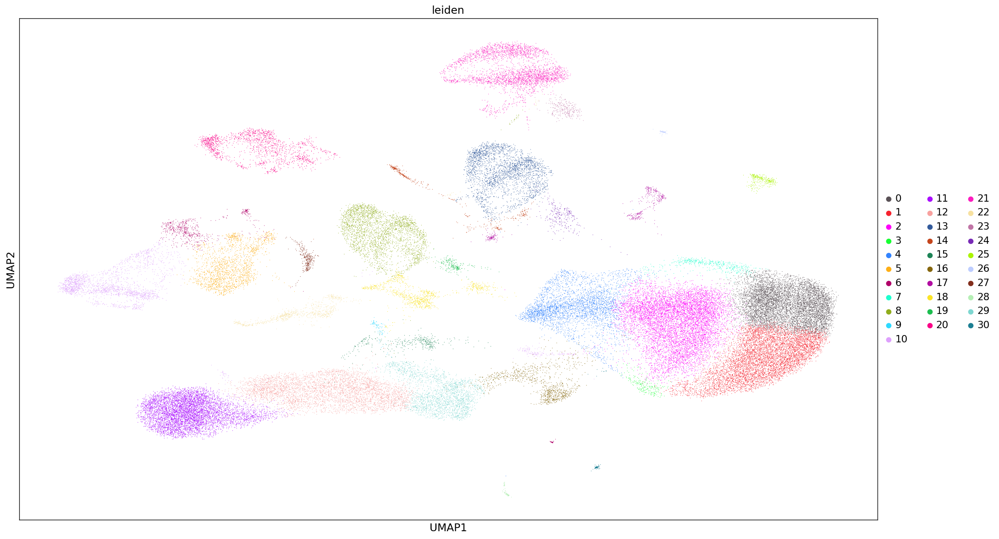

In [94]:
sc.pl.umap(adata, color=["leiden"], palette= my_colours)

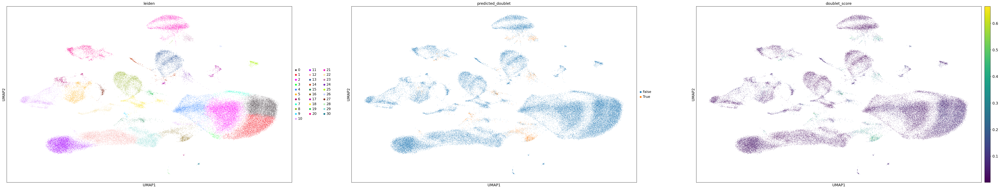

In [98]:
sc.pl.umap(
    adata,
    color=["leiden", "predicted_doublet", "doublet_score"],
    # increase horizontal space between panels
    wspace=0.1,
    size=3,
)

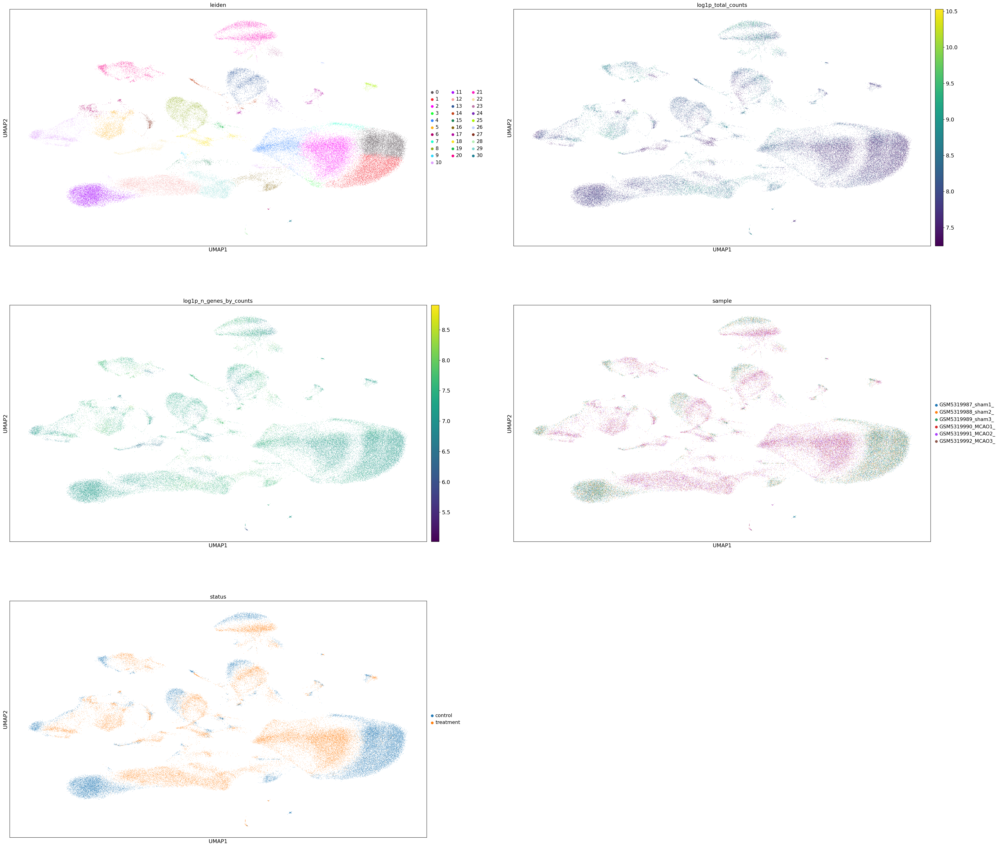

In [101]:
sc.pl.umap(
    adata,
    color=["leiden", "log1p_total_counts", "log1p_n_genes_by_counts", "sample", "status"],
    wspace=0.1,
    ncols=2,
)

In [103]:
adata

AnnData object with n_obs × n_vars = 58528 × 19707
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'status', 'leiden'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'sample_colors', 'scrublet', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'status_colors', 'leiden', 'leiden_colors', 'predicted_doublet_colors'


In [104]:
adata.write_h5ad(filename= os.path.join("Python_Objects", "adata_preprocessed.h5ad"))

In [105]:
import session_info

In [106]:
session_info.show()